# Extracción de embeddings faciales con MTCNN + FaceNet
Este cuaderno permite subir fotos de estudiantes, alinear sus rostros con MTCNN y obtener embeddings con FaceNet (InceptionResnetV1).

In [ ]:
!pip install facenet-pytorch torch torchvision numpy pillow

In [ ]:
!pip install facenet-pytorch gdown openpyxl

In [ ]:
import os
import pandas as pd
import re

# Montar Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Ruta a la carpeta compartida que contiene las imágenes
input_dir = "/content/drive/MyDrive/Colab Notebooks/Ingrese sus fotos (File responses)"

# Crear carpeta local para embeddings alineados (opcional, puedes usar luego)
output_dir = "./caras_alineadas/"
os.makedirs(output_dir, exist_ok=True)

# Leer el Excel
df = pd.read_excel("datos_entrenamiento_imagenes.xlsx")

# Crear columna con la ruta completa a la imagen en Drive
df["RutaImagen"] = df["NombreArchivo"].apply(lambda x: os.path.join(input_dir, x))

# Verificamos que esté bien
df.head()


Mounted at /content/drive


,Nombre,Sexo,ID,NombreArchivo,RutaImagen
0,Ricardo Vargas Ramírez,Hombre,1EYXGkI8LmTV3ljfLnYzL1qAbmVD7gVhJ,Ricardo_Vargas_Ramírez_1.jpg,/content/drive/MyDrive/Colab Notebooks/Ingrese...
1,Ricardo Vargas Ramírez,Hombre,1HVOUS1L6nK3WGS5UshZuT9E3Oqtb92iK,Ricardo_Vargas_Ramírez_2.jpg,/content/drive/MyDrive/Colab Notebooks/Ingrese...
2,Ricardo Vargas Ramírez,Hombre,1CI-EAsRKAc1ZRQS0dZ3hiNXE37hWHftZ,Ricardo_Vargas_Ramírez_3.jpg,/content/drive/MyDrive/Colab Notebooks/Ingrese...
3,Ricardo Vargas Ramírez,Hombre,1ycXXXCMdKohqihdhHYYF9UMlKghDR5yf,Ricardo_Vargas_Ramírez_4.jpg,/content/drive/MyDrive/Colab Notebooks/Ingrese...
4,Ricardo Vargas Ramírez,Hombre,1_z0fhXjolobsH-B-S2FAEgB7IG-aGa9e,Ricardo_Vargas_Ramírez_5.jpg,/content/drive/MyDrive/Colab Notebooks/Ingrese...


In [ ]:
import torch
from facenet_pytorch import MTCNN, InceptionResnetV1

# If you have a GPU, uncomment the following line
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Running on device: {device}')

# Initialize MTCNN and FaceNet models
mtcnn = MTCNN(keep_all=True, device=device)
resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device)

Running on device: cpu


  0%|          | 0.00/107M [00:00<?, ?B/s]

In [ ]:
! pip install facenet-pytorch gdown openpyxl

📦 Total imágenes indexadas: 161


  1%|          | 1/161 [00:03<08:21,  3.13s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  1%|          | 2/161 [00:05<07:52,  2.97s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  2%|▏         | 3/161 [00:08<07:44,  2.94s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  2%|▏         | 4/161 [00:11<07:27,  2.85s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  3%|▎         | 5/161 [00:15<08:35,  3.31s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


  4%|▎         | 6/161 [00:18<07:52,  3.05s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  4%|▍         | 7/161 [00:20<07:29,  2.92s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  5%|▍         | 8/161 [00:23<07:26,  2.92s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  6%|▌         | 9/161 [00:27<07:37,  3.01s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  6%|▌         | 10/161 [00:30<07:58,  3.17s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


  7%|▋         | 11/161 [00:33<07:27,  2.98s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  7%|▋         | 12/161 [00:35<07:09,  2.88s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  8%|▊         | 13/161 [00:38<07:05,  2.88s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  9%|▊         | 14/161 [00:42<07:42,  3.15s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  9%|▉         | 15/161 [00:45<07:31,  3.10s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 10%|▉         | 16/161 [00:47<07:04,  2.93s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


 11%|█         | 17/161 [00:50<06:50,  2.85s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


 11%|█         | 18/161 [00:53<06:52,  2.89s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


 12%|█▏        | 19/161 [01:00<09:26,  3.99s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


 12%|█▏        | 20/161 [01:05<10:23,  4.42s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 13%|█▎        | 21/161 [01:13<12:46,  5.47s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


 14%|█▎        | 22/161 [01:17<11:29,  4.96s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


 14%|█▍        | 23/161 [01:20<09:58,  4.33s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


 15%|█▍        | 24/161 [01:23<08:53,  3.89s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


 16%|█▌        | 25/161 [01:26<08:52,  3.91s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 17%|█▋        | 27/161 [01:32<07:34,  3.39s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 19%|█▉        | 31/161 [01:45<06:59,  3.22s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 22%|██▏       | 35/161 [01:58<06:46,  3.23s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 24%|██▍       | 39/161 [02:11<06:37,  3.26s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 63%|██████▎   | 101/161 [03:11<01:42,  1.71s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 63%|██████▎   | 102/161 [03:15<02:21,  2.39s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 66%|██████▌   | 106/161 [03:32<03:28,  3.79s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 66%|██████▋   | 107/161 [03:35<03:22,  3.74s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 69%|██████▉   | 111/161 [03:51<03:11,  3.84s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 70%|██████▉   | 112/161 [03:54<03:05,  3.78s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 72%|███████▏  | 116/161 [04:10<02:50,  3.79s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 73%|███████▎  | 117/161 [04:15<02:59,  4.08s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 75%|███████▌  | 121/161 [04:31<02:38,  3.96s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 76%|███████▌  | 122/161 [04:34<02:30,  3.86s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


100%|██████████| 161/161 [05:13<00:00,  1.95s/it]



🔍 PREDICCIONES SVM EN IMÁGENES DE PRUEBA:


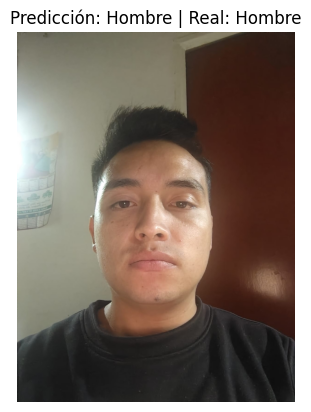

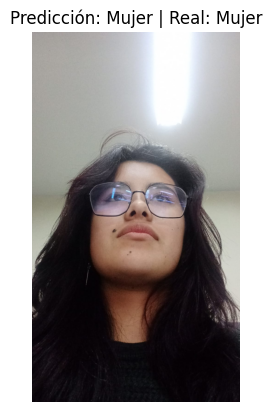

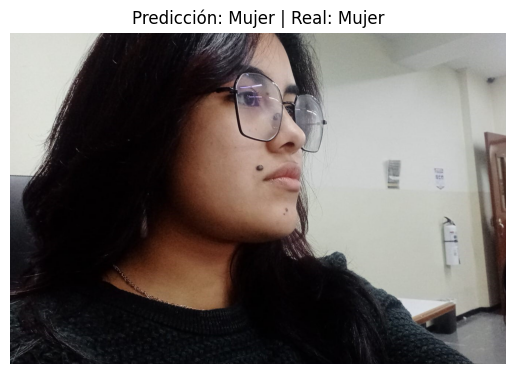

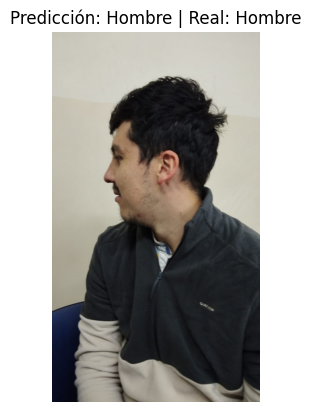

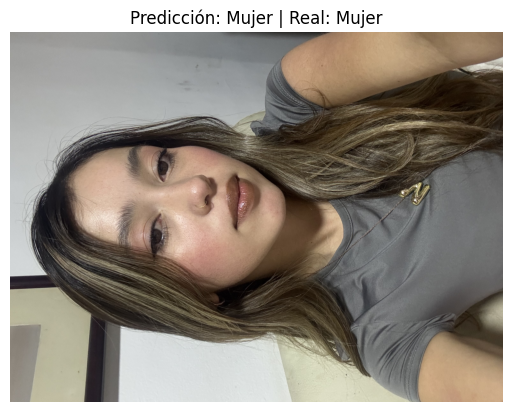

...

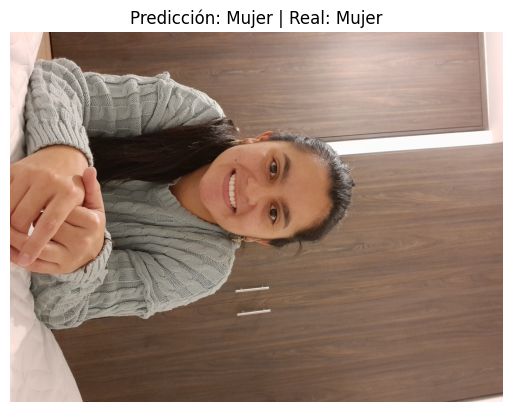

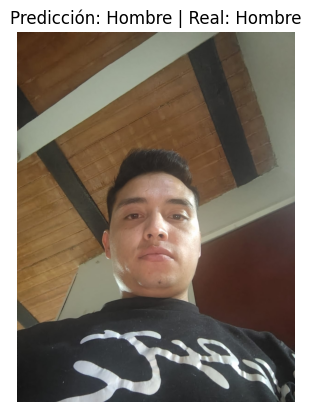

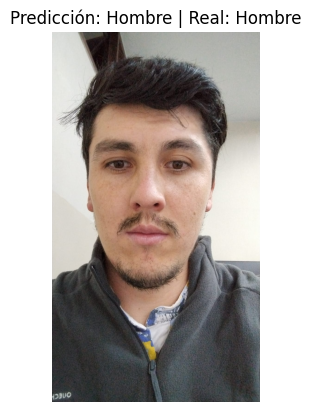

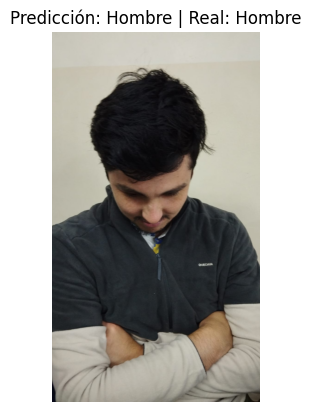

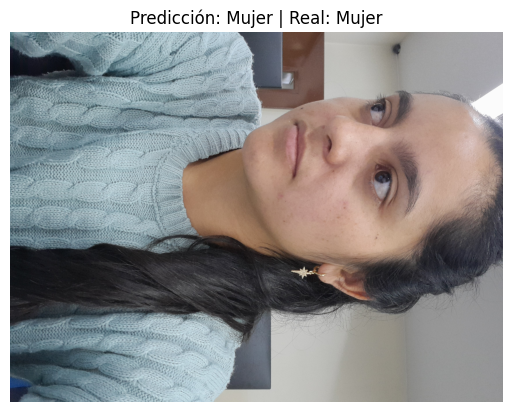


🔍 SVM LINEAL (Evaluación con 30% prueba):
              precision    recall  f1-score   support

      Hombre       1.00      1.00      1.00        22
       Mujer       1.00      1.00      1.00        15

    accuracy                           1.00        37
   macro avg       1.00      1.00      1.00        37
weighted avg       1.00      1.00      1.00        37

[[22  0]
 [ 0 15]]

✅ Total embeddings guardados: 122
❌ Total imágenes fallidas: 39
🔍 Ejemplos de fallidas: ['IMG_4593 - Ricardo Vargas Ramírez.jpg', 'IMG_4596 - Ricardo Vargas Ramírez.jpg', 'IMG_4597 - Ricardo Vargas Ramírez.jpg', 'IMG_4598 - Ricardo Vargas Ramírez.jpg', 'IMG_4599 - Ricardo Vargas Ramírez.jpg', 'IMG_4593 - Ricardo Vargas Ramírez.jpg', 'IMG_4596 - Ricardo Vargas Ramírez.jpg', 'IMG_4597 - Ricardo Vargas Ramírez.jpg', 'IMG_4598 - Ricardo Vargas Ramírez.jpg', 'IMG_4599 - Ricardo Vargas Ramírez.jpg']


In [ ]:
# === CÓDIGO COMPLETO PARA EXTRAER EMBEDDINGS CON MTCNN Y FACENET Y REALIZAR COMPARACIONES ===

import os
import pandas as pd
import unicodedata
from PIL import Image
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision import transforms
from facenet_pytorch import MTCNN, InceptionResnetV1
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

# === 1. PREPROCESAMIENTO Y NORMALIZACIÓN ===
def normalizar(texto):
    texto = texto.lower().strip()
    texto = ''.join(c for c in unicodedata.normalize('NFD', texto) if unicodedata.category(c) != 'Mn')
    texto = texto.replace(" ", "")
    return texto

# === 2. CARGA DE DATOS ===
input_dir = "/content/drive/MyDrive/Colab Notebooks/Ingrese sus fotos (File responses)"
df_excel = pd.read_excel("datos_entrenamiento_imagenes.xlsx")

archivos_imagenes = [f for f in os.listdir(input_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
emparejados = []

for _, row in df_excel.iterrows():
    nombre = row["Nombre"]
    sexo = row["Sexo"]
    nombre_norm = normalizar(nombre)

    for archivo in archivos_imagenes:
        if nombre_norm in normalizar(archivo):
            ruta = os.path.join(input_dir, archivo)
            emparejados.append({
                "Nombre": nombre,
                "Sexo": sexo,
                "Archivo": archivo,
                "RutaImagen": ruta
            })

df_imagenes = pd.DataFrame(emparejados)
print(f"📦 Total imágenes indexadas: {len(df_imagenes)}")

# === 3. MODELOS Y TRANSFORMACIONES ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
facenet = InceptionResnetV1(pretrained='vggface2').eval().to(device)
mtcnn = MTCNN(image_size=160, margin=20, device=device, post_process=True)

# === 4. EXTRAER EMBEDDINGS USANDO MTCNN ===
embeddings = []
nombres = []
sexos = []
fallidas = []
rostros_para_test = []

for _, row in tqdm(df_imagenes.iterrows(), total=len(df_imagenes)):
    archivo = row['Archivo']
    ruta = row['RutaImagen']
    nombre = row['Nombre']
    sexo = row['Sexo']

    try:
        img = Image.open(ruta).convert('RGB')
        face = mtcnn(img)

        if face is not None:
            face = face.unsqueeze(0).to(device)
            with torch.no_grad():
                embedding = facenet(face).squeeze().cpu().numpy()
            embeddings.append(embedding)
            nombres.append(nombre)
            sexos.append(sexo)
            rostros_para_test.append(img)
        else:
            print(f"❌ No se detectó rostro en: {archivo}")
            fallidas.append(archivo)
    except Exception as e:
        print(f"⚠️ Error procesando {archivo}: {e}")
        fallidas.append(archivo)

# === 5. CLASIFICACIÓN Y COMPARACIÓN DE MÉTODOS ===
X = np.array(embeddings)
le = LabelEncoder()
y = le.fit_transform(sexos)

# División entrenamiento / prueba
X_train, X_test, y_train, y_test, rostros_train, rostros_test = train_test_split(X, y, rostros_para_test, test_size=0.3, random_state=42)

# SVM Lineal (solo prueba)
clf_svm = SVC(kernel='linear')
clf_svm.fit(X_train, y_train)
y_pred_svm = clf_svm.predict(X_test)

# Mostrar predicciones con imágenes
print("\n PREDICCIONES SVM EN IMÁGENES DE PRUEBA:")
for idx, (pred, real, rostro) in enumerate(zip(y_pred_svm, y_test, rostros_test)):
    plt.imshow(rostro)
    plt.axis('off')
    plt.title(f"Predicción: {le.classes_[pred]} | Real: {le.classes_[real]}")
    plt.show()

# === 6. REPORTES ===
print("\n SVM LINEAL (Evaluación con 30% prueba):")
print(classification_report(y_test, y_pred_svm, target_names=le.classes_))
print(confusion_matrix(y_test, y_pred_svm))

# === 7. GUARDAR EMBEDDINGS ===
np.save("embeddings_estudiantes.npy", np.array(embeddings))
print(f"\n Total embeddings guardados: {len(embeddings)}")
print(f" Total imágenes que no cargaron: {len(fallidas)}")
if fallidas:
    print(f" Ejemplos de fallidas (No cargadas): {fallidas[:10]}")

📦 Total imágenes indexadas: 161


  1%|          | 1/161 [00:08<21:38,  8.12s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  1%|          | 2/161 [00:13<16:42,  6.30s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  2%|▏         | 3/161 [00:16<13:28,  5.12s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  2%|▏         | 4/161 [00:19<11:18,  4.32s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  3%|▎         | 5/161 [00:23<10:04,  3.87s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


  4%|▎         | 6/161 [00:26<09:58,  3.86s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  4%|▍         | 7/161 [00:30<09:44,  3.79s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  5%|▍         | 8/161 [00:33<09:14,  3.62s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  6%|▌         | 9/161 [00:36<08:43,  3.44s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  6%|▌         | 10/161 [00:40<08:56,  3.55s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


  7%|▋         | 11/161 [00:44<08:47,  3.51s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


  7%|▋         | 12/161 [00:47<08:22,  3.38s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


  8%|▊         | 13/161 [00:50<08:17,  3.36s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


  9%|▊         | 14/161 [00:54<08:32,  3.49s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


  9%|▉         | 15/161 [00:57<08:40,  3.56s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 10%|▉         | 16/161 [01:00<08:09,  3.38s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


 11%|█         | 17/161 [01:04<07:54,  3.29s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


 11%|█         | 18/161 [01:07<08:06,  3.40s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


 12%|█▏        | 19/161 [01:11<08:29,  3.59s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


 12%|█▏        | 20/161 [01:14<08:04,  3.44s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 13%|█▎        | 21/161 [01:17<07:41,  3.30s/it]

❌ No se detectó rostro en: IMG_4593 - Ricardo Vargas Ramírez.jpg


 14%|█▎        | 22/161 [01:21<07:37,  3.29s/it]

❌ No se detectó rostro en: IMG_4596 - Ricardo Vargas Ramírez.jpg


 14%|█▍        | 23/161 [01:25<08:19,  3.62s/it]

❌ No se detectó rostro en: IMG_4597 - Ricardo Vargas Ramírez.jpg


 15%|█▍        | 24/161 [01:28<07:53,  3.46s/it]

❌ No se detectó rostro en: IMG_4598 - Ricardo Vargas Ramírez.jpg


 16%|█▌        | 25/161 [01:31<07:33,  3.33s/it]

❌ No se detectó rostro en: IMG_4599 - Ricardo Vargas Ramírez.jpg


 17%|█▋        | 27/161 [01:39<08:15,  3.70s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 19%|█▉        | 31/161 [01:55<08:33,  3.95s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 22%|██▏       | 35/161 [02:09<07:51,  3.74s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 24%|██▍       | 39/161 [02:24<07:30,  3.70s/it]

❌ No se detectó rostro en: IMG_1948 - María José Mejia zea.jpeg


 63%|██████▎   | 101/161 [03:27<02:08,  2.14s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 63%|██████▎   | 102/161 [03:32<02:55,  2.98s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 66%|██████▌   | 106/161 [03:50<03:51,  4.20s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 66%|██████▋   | 107/161 [03:56<04:04,  4.53s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 69%|██████▉   | 111/161 [04:15<03:54,  4.70s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 70%|██████▉   | 112/161 [04:19<03:47,  4.64s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 72%|███████▏  | 116/161 [04:40<03:43,  4.96s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 73%|███████▎  | 117/161 [04:44<03:28,  4.73s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


 75%|███████▌  | 121/161 [05:02<03:02,  4.57s/it]

❌ No se detectó rostro en: 20250521_233204 - Mónica Yadira Rodríguez Martínez.jpg


 76%|███████▌  | 122/161 [05:08<03:12,  4.93s/it]

❌ No se detectó rostro en: 20250521_233032 - Mónica Yadira Rodríguez Martínez.jpg


100%|██████████| 161/161 [05:50<00:00,  2.18s/it]



🔍 CLASIFICACIÓN POR NOMBRE:
                                  precision    recall  f1-score   support

            Felipe Herrera Riaño       1.00      1.00      1.00        11
        Juan Camilo Ortiz Ibañez       1.00      1.00      1.00         8
                  Julian Mendez        1.00      1.00      1.00         3
  Maria Camila Infante González        1.00      1.00      1.00         7
           Maria Jose Mejia Zea        1.00      1.00      1.00         4
Mónica Yadira Rodríguez Martínez       1.00      1.00      1.00         4

                        accuracy                           1.00        37
                       macro avg       1.00      1.00      1.00        37
                    weighted avg       1.00      1.00      1.00        37

[[11  0  0  0  0  0]
 [ 0  8  0  0  0  0]
 [ 0  0  3  0  0  0]
 [ 0  0  0  7  0  0]
 [ 0  0  0  0  4  0]
 [ 0  0  0  0  0  4]]


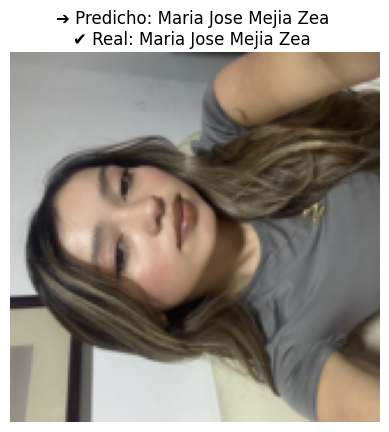

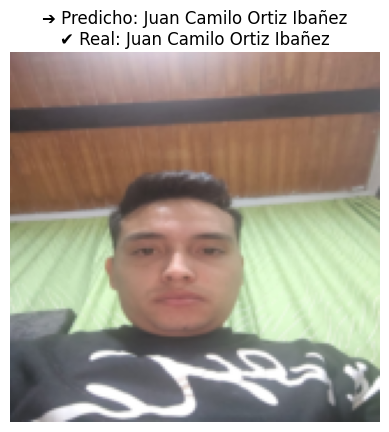

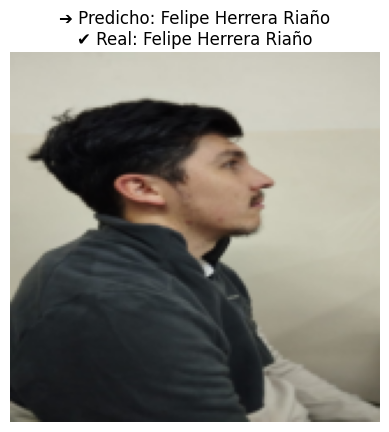

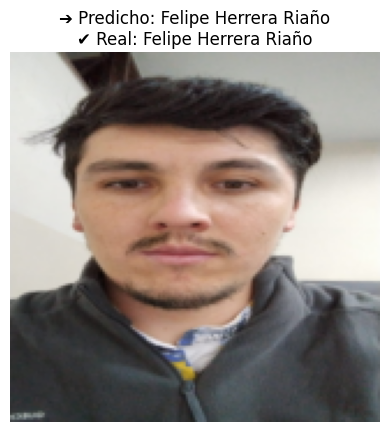

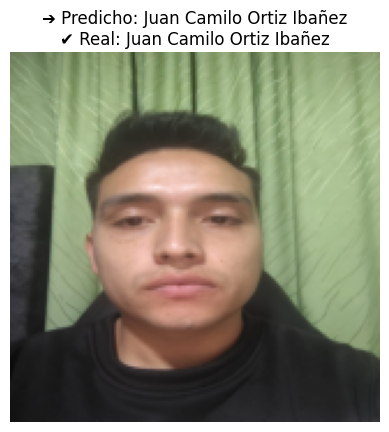

...

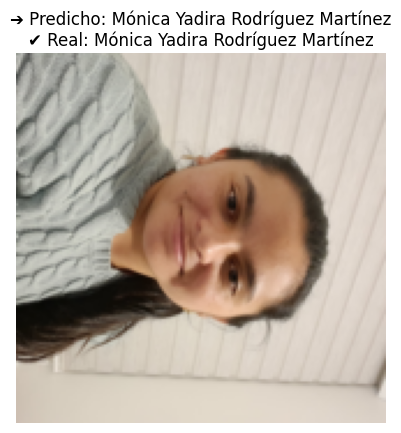

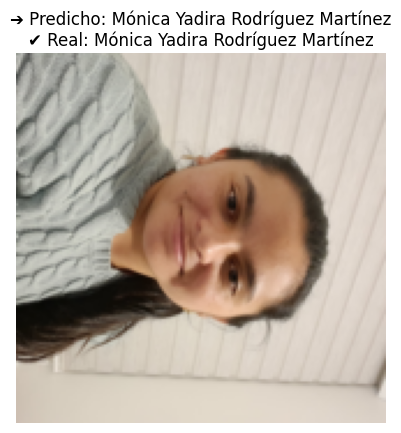

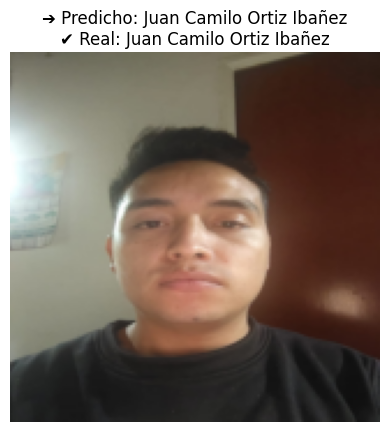

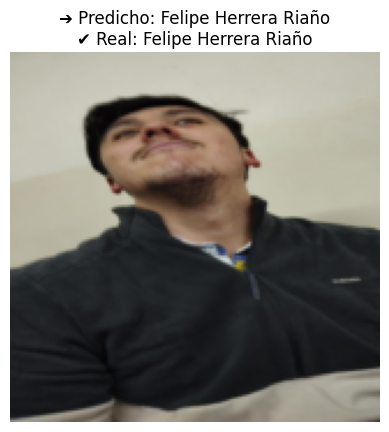

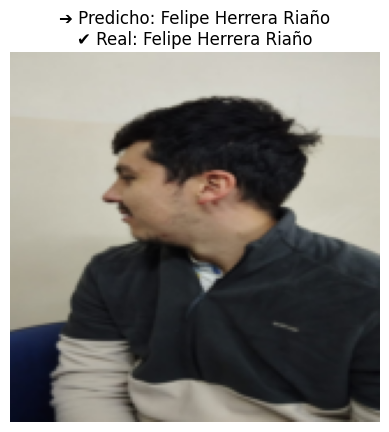


✅ Total embeddings guardados: 122
❌ Total imágenes fallidas: 39
🔍 Ejemplos de fallidas: ['IMG_4593 - Ricardo Vargas Ramírez.jpg', 'IMG_4596 - Ricardo Vargas Ramírez.jpg', 'IMG_4597 - Ricardo Vargas Ramírez.jpg', 'IMG_4598 - Ricardo Vargas Ramírez.jpg', 'IMG_4599 - Ricardo Vargas Ramírez.jpg', 'IMG_4593 - Ricardo Vargas Ramírez.jpg', 'IMG_4596 - Ricardo Vargas Ramírez.jpg', 'IMG_4597 - Ricardo Vargas Ramírez.jpg', 'IMG_4598 - Ricardo Vargas Ramírez.jpg', 'IMG_4599 - Ricardo Vargas Ramírez.jpg']


In [ ]:
# === CÓDIGO COMPLETO PARA EXTRAER EMBEDDINGS CON MTCNN Y FACENET Y REALIZAR COMPARACIONES ===

import os
import pandas as pd
import unicodedata
from PIL import Image
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision import transforms
from facenet_pytorch import MTCNN, InceptionResnetV1
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

# === 1. PREPROCESAMIENTO Y NORMALIZACIÓN ===
def normalizar(texto):
    texto = texto.lower().strip()
    texto = ''.join(c for c in unicodedata.normalize('NFD', texto) if unicodedata.category(c) != 'Mn')
    texto = texto.replace(" ", "")
    return texto

# === 2. CARGA DE DATOS ===
input_dir = "/content/drive/MyDrive/Colab Notebooks/Ingrese sus fotos (File responses)"
df_excel = pd.read_excel("datos_entrenamiento_imagenes.xlsx")

archivos_imagenes = [f for f in os.listdir(input_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
emparejados = []

for _, row in df_excel.iterrows():
    nombre = row["Nombre"]
    sexo = row["Sexo"]
    nombre_norm = normalizar(nombre)

    for archivo in archivos_imagenes:
        if nombre_norm in normalizar(archivo):
            ruta = os.path.join(input_dir, archivo)
            emparejados.append({
                "Nombre": nombre,
                "Sexo": sexo,
                "Archivo": archivo,
                "RutaImagen": ruta
            })

df_imagenes = pd.DataFrame(emparejados)
print(f" Total imágenes indexadas: {len(df_imagenes)}")

# === 3. MODELOS Y TRANSFORMACIONES ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
facenet = InceptionResnetV1(pretrained='vggface2').eval().to(device)
mtcnn = MTCNN(image_size=160, margin=20, device=device, post_process=True)

# === 4. EXTRAER EMBEDDINGS USANDO MTCNN ===
embeddings = []
nombres = []
sexos = []
fallidas = []
imagenes_test = []

for _, row in tqdm(df_imagenes.iterrows(), total=len(df_imagenes)):
    archivo = row['Archivo']
    ruta = row['RutaImagen']
    nombre = row['Nombre']
    sexo = row['Sexo']

    try:
        img = Image.open(ruta).convert('RGB')
        face = mtcnn(img)

        if face is not None:
            face = face.unsqueeze(0).to(device)
            with torch.no_grad():
                embedding = facenet(face).squeeze().cpu().numpy()
            embeddings.append(embedding)
            nombres.append(nombre)
            sexos.append(sexo)
            imagenes_test.append(img)
        else:
            print(f" No se detectó rostro en: {archivo}")
            fallidas.append(archivo)
    except Exception as e:
        print(f" Error procesando {archivo}: {e}")
        fallidas.append(archivo)

# === 5. CLASIFICACIÓN POR NOMBRE (IDENTIDAD) ===
X = np.array(embeddings)
le_nombre = LabelEncoder()
y_nombre = le_nombre.fit_transform(nombres)

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
train_idx, test_idx = next(sss.split(X, y_nombre))

X_train_n = X[train_idx]
X_test_n = X[test_idx]
y_train_n = y_nombre[train_idx]
y_test_n = y_nombre[test_idx]
imgs_test_n = [imagenes_test[i] for i in test_idx]

clf_identidad = SVC(kernel='linear')
clf_identidad.fit(X_train_n, y_train_n)
y_pred_n = clf_identidad.predict(X_test_n)

print("\n CLASIFICACIÓN POR NOMBRE:")
print(classification_report(y_test_n, y_pred_n, target_names=le_nombre.classes_))
print(confusion_matrix(y_test_n, y_pred_n))

# Mostrar predicciones con imágenes
transform = transforms.Compose([transforms.Resize((160, 160)), transforms.ToTensor()])
for i in range(len(y_test_n)):
    img_tensor = transform(imgs_test_n[i])
    img_np = np.transpose(img_tensor.numpy(), (1, 2, 0))
    plt.imshow(img_np)
    plt.title(f"➔ Predicho: {le_nombre.inverse_transform([y_pred_n[i]])[0]}\n✔ Real: {le_nombre.inverse_transform([y_test_n[i]])[0]}")
    plt.axis('off')
    plt.show()

# === 6. GUARDAR EMBEDDINGS ===
np.save("embeddings_estudiantes.npy", np.array(embeddings))
print(f"\n Total embeddings guardados: {len(embeddings)}")
print(f" Total imágenes que no cargaron: {len(fallidas)}")
if fallidas:
    print(f" Ejemplos de fallidas (No cargadas): {fallidas[:10]}")